# Evaluation of the 2008 Global Financial Crisis Impact on Corporate Capital Structure Determinants of Publicly Listed Latin American Firms Through the Use of Machine Learning Tools

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import seaborn as sns 
import matplotlib as mpl
import pickle
from sklearn.model_selection import train_test_split
from hypopt import GridSearch
from xgboost import XGBRegressor
from merf.merf import MERF
from sklearn.metrics import r2_score
import pickle
import shap
import matplotlib.animation as animation
from matplotlib.animation import  PillowWriter 

from IPython.display import Image


shap.initjs()

%matplotlib inline

In [2]:
df = pd.read_excel('Thompson_reuters_trim.xlsx')
for col in df.columns[7:]:
    df[col] = pd.to_numeric(df[col], errors = 'coerce')
for col in df.columns[:7]:
    df[col] = df[col].astype(str)  
df['NAICS National Industry Code'].replace('nan', np.nan, inplace = True)


In [3]:
df['period'] = df.apply(lambda row: pd.Period(year = int(row['Fiscal Year'][-4:]), 
                                              quarter = int(row['Fiscal Year'][2]),freq = 'Q'), axis = 1)


df.set_index('period',inplace = True)
df.drop('Fiscal Year', axis =1, inplace = True)
df.sort_index(inplace = True)

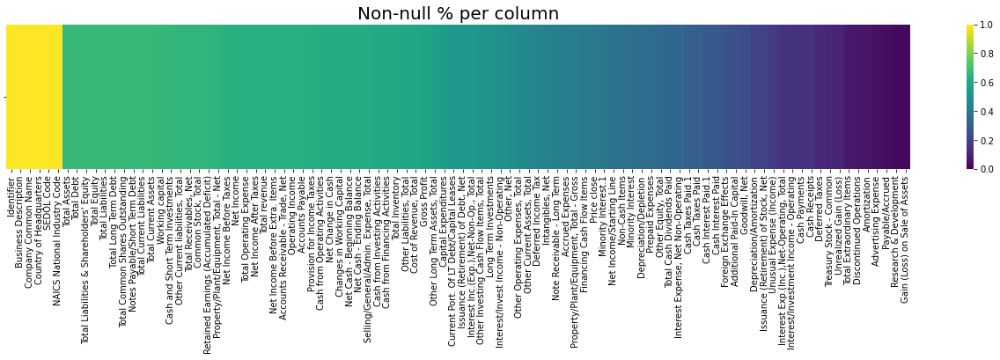

In [4]:
aux = 1-df.isnull().sum()/df.shape[0]
aux.sort_values(ascending = False, inplace = True)
nn_ordered_cols = aux.index

aux = pd.DataFrame({'':aux})
plt.figure(figsize = (23,6))
sns.heatmap(aux.T, cmap = 'viridis', vmax =1,vmin = 0)
plt.title('Non-null % per column', fontdict=dict(size=20))
plt.gcf().subplots_adjust(bottom=0.5)
#plt.savefig('Dataset Images\\Non-null pct per column - complete dataset.png')

In [5]:
null_matrix = df.isnull()
plt.figure(figsize = (23,10),dpi = 500)
sns.heatmap(1-df.isnull()[nn_ordered_cols],cmap= plt.cm.get_cmap('viridis', 2),vmax =1,vmin = 0)
plt.title('Non-Null Values',fontdict=dict(size=20))
plt.ylabel(None)
plt.tight_layout()
#plt.savefig('Dataset Images\\Non-Null values - complete dataset.png', dpi = 1000)
print('Dark: Null Value')
print('Yellow: Non-Null Value')

Dark: Null Value
Yellow: Non-Null Value


Because there is an odd behavior in the 'Price close' column we'll plot the time series of closing price per firm to clearly identify what is producing this pattern and if there are problems with our data.

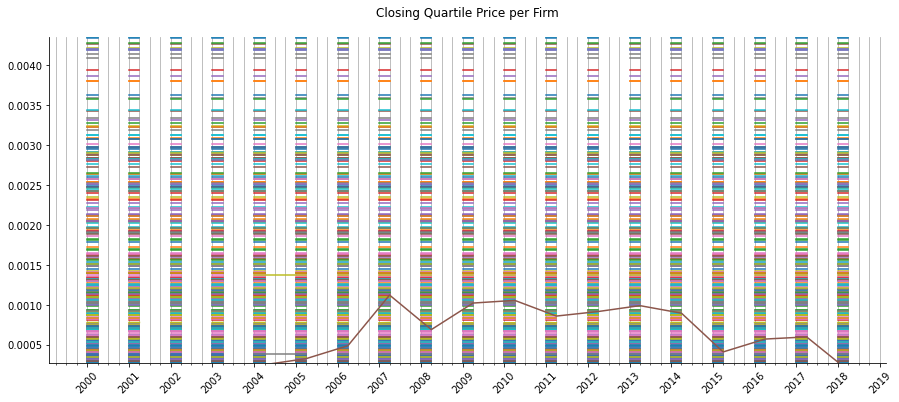

In [6]:
df_aux = df.copy()
df_aux.index = df_aux.index.to_timestamp()

#plt.style.use('seaborn-white')

years = mpl.dates.YearLocator()   # every year
months = mpl.dates.MonthLocator(interval=3) #every quarter start. IT matches with the transformation
                                            #used to change PeriodIndex to DateTimeIndex. I.E, Q1 = Jan-01.
years_fmt = mpl.dates.DateFormatter('%Y')

fig, ax = plt.subplots(figsize = (15,6))
for firm in df_aux['SEDOL Code'].unique():
    ax.plot(df_aux[df_aux['SEDOL Code']== firm]['Price close'])

ax.xaxis.set_major_locator(years)
ax.xaxis.set_minor_locator(months)
ax.xaxis.set_major_formatter(years_fmt)

ax.set(ylim=(df['Price close'].describe()['25%'], df['Price close'].describe()['75%']))
ax.set_title('Closing Quartile Price per Firm', pad = 20)

plt.grid(which='both',axis = 'x')
plt.xticks(rotation=45);


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

#plt.savefig('Dataset Images\Closing Quartile Price per Firm.png',dpi = 1000)

Because the closing price values are static and there are almost no records for Q3 and Q4, it can be concluded that this information is likely to be incorrect. Possibly there was error in the data collection step. In an ideal situation, the time series in the graph should be continuous and should vary across time.

In reference to the graph, the y-axis is fixed to show 75% of the distribution of all closing prices, removing the first and last quartiles to reduce sparsity produced by outliers.

There are a total of 57475 samples, a total of 759 firms according to the SEDOL Code and a total of 485 indistries according to the NAICS National Industry Code
Brazil, Chile, Mexico and Peru accumulate a 78% of the samples of the database


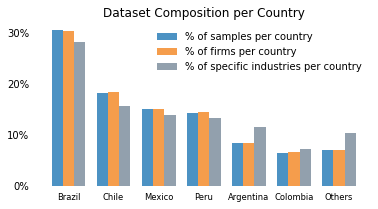

In [7]:
country_pct = df.groupby('Country of Headquarters').count()['SEDOL Code']/ df.shape[0]*100
country_pct.sort_values(ascending = False,inplace = True)
country_pct.name = 'Sample country composition'
country_pct
acum = country_pct[-6:].sum()
country_pct_aux = country_pct[:-6]
country_pct_aux = country_pct_aux.append(pd.Series(acum, index = ['Others']))
#print(country_pct_aux)


n_firms_per_country = df.groupby('Country of Headquarters')['SEDOL Code'].nunique()
firms_pct_per_country = n_firms_per_country/n_firms_per_country.sum()*100
firms_pct_per_country.sort_values(ascending = False, inplace = True)
firms_pct_per_country_aux = firms_pct_per_country[:-6]
acum = firms_pct_per_country[-6:].sum()
firms_pct_per_country_aux = firms_pct_per_country_aux.append(pd.Series(acum, index = ['Others']))
#print(firms_pct_per_country_aux)


n_industries_per_country = df.groupby('Country of Headquarters')['NAICS National Industry Code'].nunique()
industries_pct_per_country = n_industries_per_country/n_industries_per_country.sum()*100
industries_pct_per_country.sort_values(ascending = False, inplace = True)
industries_pct_per_country_aux = industries_pct_per_country[:-6]
acum = industries_pct_per_country[-6:].sum()
industries_pct_per_country_aux = industries_pct_per_country_aux.append(pd.Series(acum, index = ['Others']))
#print(industries_pct_per_country_aux.sum)

#plt.style.use('seaborn-whitegrid')
plt.figure(figsize=(6,3))
plt.bar([2*i-0.5 for i in range(7)], country_pct_aux, width = 0.5, label = '% of samples per country',
       color = '#1F77B4', alpha = 0.8)
plt.bar([2*i for i in range(7)], firms_pct_per_country_aux[country_pct_aux.index], 
        width = 0.5, label = '% of firms per country', alpha = 0.8, color = '#f3851f')
plt.bar([2*i+0.5 for i in range(7)], industries_pct_per_country_aux[country_pct_aux.index], 
        width = 0.5, label = '% of specific industries per country', color='lightslategrey', alpha = 0.8)
plt.xticks([2*i for i in range(7)], country_pct_aux.index)
#plt.gca().yaxis.grid()
plt.legend(frameon = False)


for spine in plt.gca().spines.values():
    spine.set_visible(False)

plt.gca().yaxis.set_major_formatter(mpl.ticker.PercentFormatter(decimals=0))
plt.gca().yaxis.set_major_locator(plt.MultipleLocator(10))
plt.title('Dataset Composition per Country')
#plt.xticks(rotation = 10)
plt.xticks(**dict(fontsize= 'smaller'))
plt.tick_params(bottom = False, left = False)
#plt.grid(axis = 'y')

#plt.savefig('Dataset Images\Dataset composition per Country.png', dpi = 500)
print('There are a total of {} samples, a total of {} firms according to the SEDOL Code and a total of {} indistries according to the NAICS National Industry Code'.
     format(df.shape[0], n_firms_per_country.sum(), n_industries_per_country.sum()))
print('Brazil, Chile, Mexico and Peru accumulate a {:.0f}% of the samples of the database'.format(country_pct.iloc[:4].sum()))

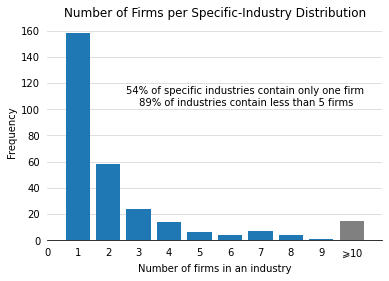

In [8]:
#Firms per industry and more relevant industries
#industry_map = {}
plt.figure()
aux = df.groupby('NAICS National Industry Code')['SEDOL Code'].nunique().value_counts().sort_index(ascending = True)

more_equal_than_10 = aux.iloc[9:].sum()
aux = aux[:9]


plt.bar(aux.index, aux, zorder = 3)
plt.bar([10], more_equal_than_10, zorder = 3, color = 'gray')

plt.xlabel('Number of firms in an industry')
plt.ylabel('Frequency')
plt.title('Number of Firms per Specific-Industry Distribution')
for spine in plt.gca().spines.values():
    spine.set_visible(False)
plt.gca().spines['bottom'].set_visible(True)  
plt.grid(axis = 'y', zorder = 0, alpha = 0.5)
plt.tick_params(left = False, bottom = False)
plt.text(6.5,103, '{:.0f}% of specific industries contain only one firm\n {:.0f}% of industries contain less than 5 firms'.
         format(aux[1]/(aux.sum()+more_equal_than_10)*100, aux.iloc[:5].sum()/(aux.sum()+more_equal_than_10)*100), 
         ha = 'center')

tick_labels = [n for n in range(10)]
tick_labels.append(r"$\geqslant10$")
plt.xticks(range(12), tick_labels);
#plt.savefig('Dataset Images\\Number of Firms per Spefific-Industry Distribution.png',dpi = 500)

The previous graph refers to specific-industry because it considers the six-digit NAICS Code instead of considering only the first two digits, which refers to the general industry.

Consider the sparsity of this feature when implementing a model.

In [9]:
#Get the NAICS Title Industry (General Industry) for each firm through https://www.naics.com/search/.

NAICS = pd.read_html('https://www.naics.com/search/')[0]
for col in NAICS.columns:
    NAICS[col].astype(str)
NAICS.drop('Number of Business Establishments',axis = 1, inplace = True)
NAICS.dropna(inplace = True) #Because if NAN, it prevent the string type casting.
print(NAICS)
NAICS['Code'] = NAICS['Code'].apply(lambda code:code[:2])
df['Industry'] = df['NAICS National Industry Code'].apply(lambda code: np.nan if code is np.nan else code[:2])
map_exceptions = {'32': '31', '33':'31', '45':'44','49':'48'}
df['Industry'] = df['Industry'].apply(lambda code: map_exceptions[code] if (code in map_exceptions.keys()) else code)
df[['NAICS National Industry Code','Industry']].head(5)
df = pd.merge(df.reset_index(),NAICS, left_on='Industry', right_on='Code', how = 'left')
df.drop(['Industry', 'Code'], axis = 1, inplace = True)
df.set_index('period', inplace = True)

print('\nFirms {} have Null values in the industry field'.format(df[df['NAICS National Industry Code'].isnull()]['SEDOL Code'].unique()))

     Code                                     Industry Title
0      11         Agriculture, Forestry, Fishing and Hunting
1      21                                             Mining
2      22                                          Utilities
3      23                                       Construction
4   31-33                                      Manufacturing
5      42                                    Wholesale Trade
6   44-45                                       Retail Trade
7   48-49                     Transportation and Warehousing
8      51                                        Information
9      52                              Finance and Insurance
10     53                     Real Estate Rental and Leasing
11     54   Professional, Scientific, and Technical Services
12     55            Management of Companies and Enterprises
13     56  Administrative and Support and Waste Managemen...
14     61                               Educational Services
15     62               

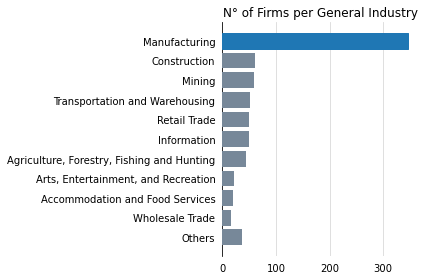

In [10]:
aux = df.groupby('Industry Title')['SEDOL Code'].nunique().sort_values(ascending = True)
others = aux.iloc[:5]
aux_mod = aux.iloc[5:]

plt.figure()
bars1 = plt.barh(['Others'], others.sum(), color='lightslategrey', zorder = 3)
bars2 = plt.barh(aux_mod.index, aux_mod,color='lightslategrey', zorder = 3)
bars2[9].set_color('#1F77B4')

plt.tick_params(left = False, bottom = False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)

plt.grid(axis = 'x', zorder = 0, alpha = 0.5)

plt.title('N° of Firms per General Industry')
plt.tight_layout()
#plt.savefig('Dataset Images\\N° of Firms per General Industry.png',dpi = 500)

Elimination of samples of firms that have headquarters in countries with untrustworthy data reporting reputation, and columns that are not necessary to compute the financial indicators commonly used in the literature as some of the capital structure determinants. 

In [11]:
#Manipulation for easily deleting countries not contained in the list.
keep_c = ['Brazil', 'Chile', 'Mexico',  'Peru']
df['keep_country'] = df['Country of Headquarters'].apply(lambda c: True if c in keep_c else False)

df_01 = df.drop(['Identifier', 'Company Common Name','Business Description'], axis = 1)
#Columns needed for computing financial indicators
keep_cols =['Country of Headquarters', 'SEDOL Code','Industry Title','Total Assets',
                    'Total Liabilities', 'Total Equity', 'Total Debt', 'Property/Plant/Equipment, Total - Net',
                   'Net Income', 'Total Current Assets', 'Total Current Liabilities','keep_country']

#Null evaluation progress
df_null_ev = pd.DataFrame(1-df[keep_cols].isnull().sum()/df.shape[0], columns = ['it_0']).drop('keep_country')
df_01 = df_01[keep_cols]
df_01 = df_01[df_01['keep_country'] == True].drop('keep_country', axis =1)
df_null_ev['it_01'] = 1-df_01.isnull().sum()/df_01.shape[0]

Individual firm pre-processed features plotting across time.

In [12]:
# for code in df_01['SEDOL Code'].unique():
#     plt.close()
#     fig, ax = plt.subplots(figsize = (12,6))
#     df_01[df_01['SEDOL Code']==code].iloc[:,3:].plot(ax = ax);
#     plt.xlabel('')
#     plt.ylabel('USD')
#     plt.legend(frameon = True)
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     plt.savefig('Dataset Images\pre-processed_features_per_firm\{}.png'.format(code), dpi = 100)

# Each pre-processed feature has strong autocorrelation. This should be strongly considered when and if a filling method
# is considered for missing values.

In [13]:
aux = 1-df_01.isnull().sum()/df_01.shape[0]
aux.sort_values(ascending = False, inplace = True)
nn_ordered_cols = aux.index

null_matrix = df_01.isnull()
plt.figure(figsize = (23,10),dpi = 500)
sns.heatmap(1-df_01.isnull()[nn_ordered_cols],cmap = plt.cm.get_cmap('viridis', 2),vmax =1,vmin = 0)
plt.title('Non-Null Values',fontdict=dict(size=20))
plt.ylabel(None)
plt.tight_layout()
#plt.savefig('Dataset Images\\Non-Null values - pre-processed features.png', dpi = 1000)

pct_change = (df_01.shape[0]-df_01.dropna().shape[0])/df_01.shape[0]*100
print('At this point, dropping all samples with one or more Null values would result in a decrease of {:.1f}% in the dataset size.'.
      format(pct_change))

At this point, dropping all samples with one or more Null values would result in a decrease of 38.9% in the dataset size.


In [14]:
#Reindexing DataFrame with MultiIndex
df_01 = df_01.reset_index().set_index(['SEDOL Code', 'period'])
df_01.sort_index(inplace = True)
df_01.head(5)

Country of Headquarters Industry Title  Total Assets  \
SEDOL Code period                                                        
2000859    2000Q1                    Peru  Manufacturing           NaN   
           2000Q2                    Peru  Manufacturing           NaN   
           2000Q3                    Peru  Manufacturing           NaN   
           2000Q4                    Peru  Manufacturing           NaN   
           2001Q1                    Peru  Manufacturing           NaN   

                   Total Liabilities  Total Equity  Total Debt  \
SEDOL Code period                                                
2000859    2000Q1                NaN           NaN         NaN   
           2000Q2                NaN           NaN         NaN   
           2000Q3                NaN           NaN         NaN   
           2000Q4                NaN           NaN         NaN   
           2001Q1                NaN           NaN         NaN   

                   Property/Plant/Equipment, Total - Net  Net Income  \
SEDOL Code period                                                      
2000859    2000Q1                                    NaN         NaN   
           2000Q2                                    NaN         NaN   
           2000Q3                                    NaN         NaN   
           2000Q4                                    NaN         NaN   
           2001Q1                                    NaN         NaN   

                   Total Current Assets  Total Current Liabilities  
SEDOL Code period                                                   
2000859    2000Q1                   NaN                        NaN  
           2000Q2                   NaN                        NaN  
           2000Q3                   NaN                        NaN  
           2000Q4                   NaN                        NaN  
           2001Q1                   NaN                        NaN

Verification of continuity of time series for each firm to guarantee a correct implementation of lagged columns/variables.

In [15]:
firms = list(set(df_01.index.get_level_values(0)))
firms.sort()
i=0
uncomplete =[]
for firm in firms:
#     print(' {} '.center(80,'*').format(firm))

#     print(df_01.loc[(firm)].index)
#     print(df_01.loc[(firm)].index[0])
#     print(df_01.loc[(firm)].index[-1])
#     print(pd.period_range(df_01.loc[(firm)].index[0],end = df_01.loc[(firm)].index[-1], freq = 'Q' ))

    curr_index = df_01.loc[(firm)].index
    aux_index = pd.period_range(df_01.loc[(firm)].index[0],end = df_01.loc[(firm)].index[-1],freq = 'Q')

    try:
        index_check = sum(curr_index==aux_index)
        if index_check == len(curr_index): i=i+1
    except: uncomplete.append(firm)
print('Firms with discontinuous quarterly time series: {}.'.format(uncomplete))
print('{:.1f}% of firms have continuous time series. I.e. {:.1f}% of firms have no missing quarters between the first and last observed quarters of that firm.'.format(i/len(firms)*100,i/len(firms)*100))

Firms with discontinuous quarterly time series: ['2186986', '2390572', '2448200', '2821867', '2829850', 'B3PRBK3'].
99.0% of firms have continuous time series. I.e. 99.0% of firms have no missing quarters between the first and last observed quarters of that firm.


The DataFrame is filled with rows with missing values representing missing quarters to complete uncompleted firm series.

In [16]:
#To reindex firms with missing quarterly periods:
error_to_reindex = []
df_02 = df_01.copy()
for firm in uncomplete:
    try: aux_df = df_02.loc[(firm)].reindex(pd.period_range(df_02.loc[(firm)].index[0],
                                                          end = df_02.loc[(firm)].index[-1], freq = 'Q'))
    except Exception as e: 
        error_to_reindex.append((firm,e))
        continue

    aux_df.index = pd.MultiIndex.from_product([[firm],aux_df.index]) #Set correct index for posterior concatenation
    drop_index = pd.MultiIndex.from_product([[firm],df_02.loc[(firm)].index])
    
    df_02.drop(drop_index, inplace = True) #Deletes all entries of incomplete firm
    df_02 = pd.concat([df_02, aux_df]) #Adds complete serie of the previous uncompleted firm

#Removal of firm '2448200':
index = pd.MultiIndex.from_product([['2448200'],df_02.loc[('2448200')].index])
df_02.drop(index, inplace = True)

    
print(error_to_reindex)
print('\nFirm \'2448200\' has repeated quarters and all numerical fields filled with NA values, therefore it has been removed from the dataset.')

#Because of a firm removal, the firm list needs to be updated:
firms.remove('2448200')

[('2448200', ValueError('cannot reindex from a duplicate axis'))]

Firm '2448200' has repeated quarters and all numerical fields filled with NA values, therefore it has been removed from the dataset.


In [17]:
def create_lag(var,shift,df):
    '''This function is only usable in a dataframe with MultIindex ['SEDOL CODE','period'].
    It adds a new column to the input df  with shifted periods (quarters)'''
    

    aux_series = pd.Series(dtype=np.float)
    verbose = False
    for firm in firms:
        aux = df.loc[(firm),var].sort_index().shift(shift) #level 0 index is lost when loc indexing.

#         if verbose is True:
#             print(' {} , {} '.format(firm,i).center(80, '*'))
#             print('aux:\n\n{}'.format(aux))
#             print('\nindex to insert:\n\n{}'.format(df.index[i:i+aux.shape[0]]))

        aux.index = pd.MultiIndex.from_product([[firm], aux.index])
        aux_series = pd.concat([aux_series,aux]) #When concatenating, the MultiIndex casts to a tuple index.
    aux_series.name = '{} - lag{}'.format(var,shift)
    aux_series.index = pd.MultiIndex.from_tuples(aux_series.index) #Casting back to a MultiIndex
    aux_series.rename_axis(['SEDOL Code', 'period'], inplace = True)
    df = pd.merge(df, aux_series, left_index=True,right_index=True)
    return df

In [18]:
max_lag = 9 #All columns lagged upto 8 cuarters. I.e. 2 years
for var in df_02.columns[2:]:
    for lag in range(1,max_lag):
        df_02 = create_lag(var,lag,df_02)

Calculation of financial indicators.

In [19]:
df_02['Growth'] = (df_02['Total Assets']-df_02['Total Assets - lag1'])/df_02['Total Assets - lag1']
for lag in range(1,max_lag):
    if lag < max_lag-1:
        df_02['Growth - lag{}'.format(lag)] = (df_02['Total Assets - lag{}'.format(lag)]-df_02['Total Assets - lag{}'.format(lag+1)])/df_02['Total Assets - lag{}'.format(lag+1)]

df_02['Tangibility'] = df_02['Property/Plant/Equipment, Total - Net']/df_02['Total Assets']
for lag in range(1,max_lag):
    df_02['Tangibility - lag{}'.format(lag)] = df_02['Property/Plant/Equipment, Total - Net - lag{}'.format(lag)]/df_02['Total Assets - lag{}'.format(lag)]
    

df_02['Liquidity'] = df_02['Total Current Assets']/ df_02['Total Current Liabilities']
for lag in range(1,max_lag):
    df_02['Liquidity - lag{}'.format(lag)] = df_02['Total Current Assets - lag{}'.format(lag)]/ df_02['Total Current Liabilities - lag{}'.format(lag)]


df_02['Profitability'] = df_02['Net Income']/df_02['Total Assets']
for lag in range(1,max_lag):
    df_02['Profitability - lag{}'.format(lag)] = df_02['Net Income - lag{}'.format(lag)]/df_02['Total Assets - lag{}'.format(lag)]

    
df_02['Firm size'] = df_02['Total Assets'].apply(np.log)
for lag in range(1,max_lag):
    df_02['Firm size - lag{}'.format(lag)] = df_02['Total Assets - lag{}'.format(lag)].apply(np.log)

    
df_02['Total leverage'] = df_02['Total Liabilities']/df_02['Total Assets']
for lag in range(1,max_lag):
     df_02['Total leverage - lag{}'.format(lag)] = df_02['Total Liabilities - lag{}'.format(lag)]/df_02['Total Assets - lag{}'.format(lag)]
    
    
df_02['Financial leverage'] = df_02['Total Debt']/df_02['Total Equity']
for lag in range(1,max_lag):
    df_02['Financial leverage - lag{}'.format(lag)] = df_02['Total Debt - lag{}'.format(lag)]/df_02['Total Equity - lag{}'.format(lag)]   

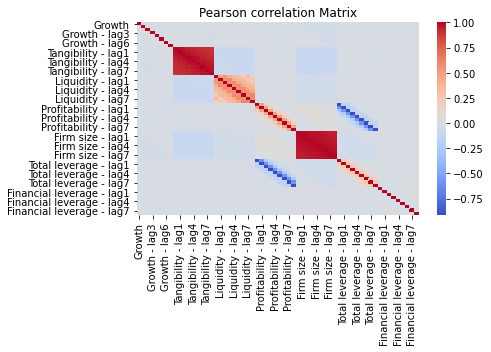

In [20]:
financial_indicators = ['Growth',
                       'Tangibility',
                       'Liquidity',
                       'Profitability',
                       'Firm size',
                       'Total leverage',
                       'Financial leverage']

aux_cols = []
for ind in financial_indicators:
    aux_cols.append(ind)
    for lag in range(1,9):
        if (lag == 8) & (ind == 'Growth'):continue
        aux_cols.append('{} - lag{}'.format(ind, lag))
        
plt.figure(figsize = (7,5))  
plt.title('Pearson correlation Matrix')
sns.heatmap(df_02[aux_cols].corr(), cmap = 'coolwarm')
plt.tight_layout()
#plt.savefig('Dataset Images\Pearson correlation Matrix.png',dpi = 1000)

In [21]:
plt.figure(figsize = (23,10),dpi = 600)
sns.heatmap(1-df_02.reset_index().set_index('period').sort_index().isnull(), cmap = plt.cm.get_cmap('viridis', 2));
plt.title('Non-Null values - upto 2 years lagged variables')
plt.ylabel('')
plt.tight_layout()
#plt.savefig('Dataset Images\\Non-Null values - upto 2 years lagged variables.png', dpi = 1000)

drop_pct = (df_02.shape[0]-df_02.dropna().shape[0])/df_02.shape[0]*100
drop_net = df_02.shape[0]-df_02.dropna().shape[0]

print('Dropping all samples with at least one NA value at this point, considering {} lagged periods will result in a decrease of {:.1f}% in the dataset size.'.
     format(max_lag-1,drop_pct))
print('Dataset size pre-drop: {}\nDataset size post-drop: {}'.format(df_02.shape[0],df_02.dropna().shape[0]))

Dropping all samples with at least one NA value at this point, considering 8 lagged periods will result in a decrease of 56.1% in the dataset size.
Dataset size pre-drop: 44769
Dataset size post-drop: 19640


The plot corresponds to the dataset's resulting size by removing all samples with one or more Null entries.


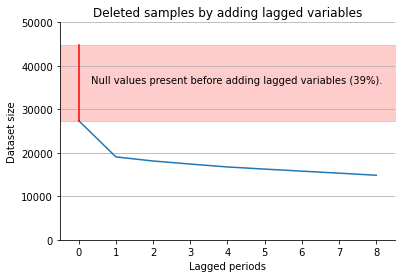

In [22]:
#Values will be stored and then will be used for plotting. The computing of these values was done
#by executing the previous code manually for different max_lag values.

dataset_size = [27403, 19065, 18119, 17420, 16748, 16260, 15789, 15322, 14845]
dataset_size_with_nulls = 44769
lagged_periods = np.arange(9)

plt.figure()
plt.plot(lagged_periods, dataset_size)
plt.plot([0,0],[dataset_size_with_nulls,dataset_size[0] ],'r')
plt.xlabel('Lagged periods')
plt.ylabel('Dataset size')
plt.title('Deleted samples by adding lagged variables')
plt.grid(axis = 'y')
plt.fill_between([-1,9], [dataset_size_with_nulls,dataset_size_with_nulls], 
                 [dataset_size[0], dataset_size[0]], color = 'r', alpha = 0.2)
plt.xlim((-0.5,8.5))
plt.ylim((0,50000))
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.text(4.25,(dataset_size_with_nulls+dataset_size[0])/2,'Null values present before adding lagged variables ({:.0f}%).'.
         format((dataset_size_with_nulls-dataset_size[0])/dataset_size_with_nulls*100),ha ='center')
#plt.savefig('Dataset Images\Deleted samples by adding lagged variables.png', dpi = 500)

#plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(5000))
print('The plot corresponds to the dataset\'s resulting size by removing all samples with one or more Null entries.')

Financial indicators per firm plots.

In [23]:
# for firm in firms:
#     plt.close()
#     fig, ax = plt.subplots(figsize = (12,6), dpi = 100)
#     df_02.sort_index(level = 1).loc[(firm),financial_indicators].plot(ax = ax)
#     plt.xlabel('')
#     plt.title('Firm - {}'.format(firm))
#     plt.ylabel('')
#     plt.legend()
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     plt.savefig('Dataset Images\processed_features_per_firm\{}.png'.format(firm), dpi = 100)

Observing each firm individually, it is possible to note that each financial indicator is heavily autocorrelated, which makes it difficult to use simple imputation techniques for missing data like using the mean or last seen value. A reasonable technique to consider could be interpolation or an individual time series model, however it is estimated that the work needed to validate the chosen technique are unreasonable considering a gain/effort evaluation because of the complexity of the imputation process. One way to determine if the creation an imputation process for missing data is worth in terms of time and efforts is to analyze the model’s performance as a function of the training data through training curves, however the first proposed formulation for this project consist in the training of 68 models, for which an individual learning curve per model should be analyzed to make this evaluation which seems pretty unreasonable.

With so few samples per firm, is impossible to fit an individual model per firm.


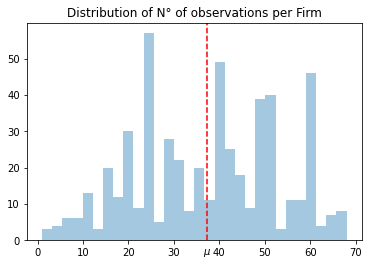

In [24]:
aux = df_02.reset_index().dropna()['SEDOL Code'].value_counts()
sns.distplot(aux,kde = False, bins = 30)
plt.title('Distribution of N° of observations per Firm')
plt.xlabel(None)
# plt.gca().spines['right'].set_visible(False)
# plt.gca().spines['top'].set_visible(False)
plt.axvline(aux.mean(), ls = '--', color = 'r')
plt.text(aux.mean(), -4, r'$\mu$', ha = 'center')
#plt.savefig('Dataset Images\Distribution of N° of samples per firm.png', dpi = 500)
print('With so few samples per firm, is impossible to fit an individual model per firm.')

In [25]:
df_03 = df_02.copy()
df_03 = pd.get_dummies(df_03, columns = ['Country of Headquarters'])

df_03['Incompatible'] = df_03.apply(lambda row: 
                                    True if ((row['Total leverage']>1) |
                                             (row['Tangibility']>1)|
                                             (row['Growth']>100)|
                                             (row['Growth - lag1']>100)|
                                             (row['Growth - lag2']>100)|
                                             (row['Growth - lag3']>100)|
                                             (row['Growth - lag4']>100)|
                                             (row['Growth - lag5']>100)|
                                             (row['Growth - lag6']>100)|
                                             (row['Growth - lag7']>100)) else 0, axis = 1)


print('{} samples have inconsistent values for tangibility or total leverage.'.format(df_03['Incompatible'].sum()))
df_03.drop(df_03[df_03['Incompatible']==True].index, inplace = True)
df_03.drop('Incompatible', axis = 1, inplace = True)

2187 samples have inconsistent values for tangibility or total leverage.


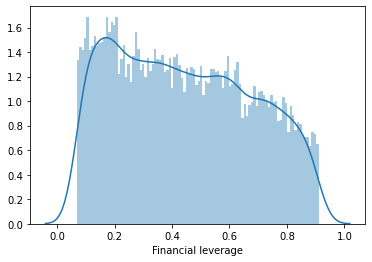

In [26]:
sns.distplot(df_03[(df_03['Financial leverage']>0.068072) & (df_03['Financial leverage']<0.91)]['Financial leverage'], bins = 100);
#plt.savefig('Dataset Images\Financial leverage distribution.png',dpi = 500)

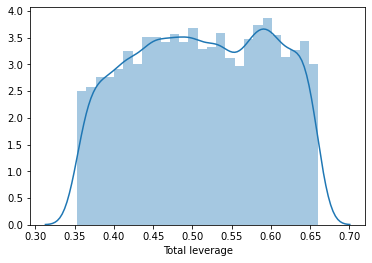

In [27]:
aux_series = df_03['Total leverage'].replace([-np.inf,np.inf],np.nan)
q1 = aux_series.describe().iloc[4]
q4 = aux_series.describe().iloc[6]

sns.distplot(aux_series[(aux_series>q1)&(aux_series<q4)] );
#plt.savefig('Dataset Images\Total leverage distribution.png', dpi = 500)

Text(0.5, 1.0, 'Samples per Quarter distribution')

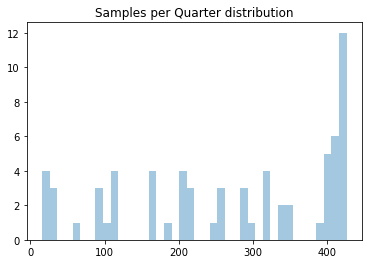

In [28]:
sns.distplot(df_03.dropna().groupby(level = 1)['Industry Title'].count(), bins = 40, kde = False);
plt.xlabel(None)
plt.title('Samples per Quarter distribution')
#plt.savefig('Dataset Images\Samples per Quarter distribution.png', dpi = 500)

In [29]:
#Construct dataset for period and lagged variables.

financial_indicators = ['Growth',
                        'Tangibility',
                        'Liquidity',
                        'Profitability',
                        'Firm size',
                        'Total leverage',
                        'Financial leverage']

#Without data leakage columns. I.e Total Liabilities & Total Current Liabilities.
pre_processed_info = ['Total Assets',
                      'Total Liabilities',
                      'Total Current Liabilities',
                      'Total Equity',
                      'Total Debt',
                      'Property/Plant/Equipment, Total - Net',
                      'Net Income',
                      'Total Current Assets',]



lag_removal_cols = {}
max_lag = [0,4,8] #years included as lagged variables. I.e 1(year): 4 quarters, 2(years):8 quarters.

for lag_iter in max_lag:
    lag_removal_cols[lag_iter] = []
    for col in financial_indicators+pre_processed_info:
        for lag in range(lag_iter+1,9):
            lag_removal_cols[lag_iter].append('{} - lag{}'.format(col,lag))   
    if lag_iter<8:
        lag_removal_cols[lag_iter].remove('Growth - lag8') #Its not computed originaly because it would need Total Assets - lag9

        
# Recesion in the US. Fourth quarter of 2007 until the third quarter of 2009
sub_sets = [((('2007Q4','2009Q3')),'crisis'),
            ((('2000Q1','2007Q4')), 'pre-crisis'),
            ((('2009Q3','2018Q4')), 'post-crisis'),
           ((('2000Q1','2018Q4')), 'complete')]


data = {} #data is a dict that contains, first the period, and then the lag structure.
df_03.sort_index(inplace = True)
for period, period_name in sub_sets:
    data[period_name]={}
    for lag in max_lag:
        data[period_name][lag] = df_03.loc[(slice(None),slice(period[0],period[1])),:].copy()
        data[period_name][lag].drop(lag_removal_cols[lag], axis = 1, inplace = True)
        data[period_name][lag].replace([np.inf, -np.inf], np.nan, inplace = True)
        data[period_name][lag].dropna(inplace = True)
    print('Dataset size {}: {}'.format(period_name, data[period_name][8].shape[0]))
print('\ndata level 0 keys: {}'.format(data.keys()))
print('data level 1 keys: {}'.format(data['crisis'].keys()))

pickle.dump(data, open('data.pkl', 'wb'))
#Data dict contains ready-to-use datasets

Dataset size crisis: 1768
Dataset size pre-crisis: 2556
Dataset size post-crisis: 14226
Dataset size complete: 18108

data level 0 keys: dict_keys(['crisis', 'pre-crisis', 'post-crisis', 'complete'])
data level 1 keys: dict_keys([0, 4, 8])


In [30]:
data = pickle.load(open('data.pkl', 'rb'))

Hyperparameter optimization and model fitting - sequential models.

In [31]:
#Grid Search implementation.

def transform(X,y):
    clusters = X.reset_index()['SEDOL Code']
    Z = np.ones((X.shape[0], 1))
    return X.reset_index().iloc[:,2:], Z, clusters, y.reset_index().iloc[:,-1]


def fit_temporal_sequence_models(training_periods = 7, lagged_periods = 4, leverage = 'Total leverage', 
                                 use_non_financial_indicators = True, autoregressive = True):
    '''7 training periods = 2 years
    3 training periods = 1 year
    lagged periods: [0,4,8]'''


    grid = {'n_estimators':[2,5,10,20,30,40,50,100,200,300,500,1000,1250,1500,1750,2000,2250,2500], 
                 'max_depth':[3],
                  'n_jobs':[-1],
                  'learning_rate': np.logspace(0,-4,5)}



    t0_cols =['Industry Title',
                  'Growth', 'Total Equity',
                            'Tangibility',
                            'Liquidity',
                            'Profitability',
                            'Firm size',
                            'Total leverage',
                            'Financial leverage',
                            'Total Assets',
                            'Total Liabilities',
                            'Total Current Liabilities',
                            'Total Debt',
                            'Property/Plant/Equipment, Total - Net',
                            'Net Income',
                            'Total Current Assets',] #These corresponds to all info in t0.
    

    
    
    if leverage == 'Total leverage':
        other_lev_col = ['Financial leverage']
    else: other_lev_col = ['Total leverage']
        
    if autoregressive == False:
        current_lev_col = [leverage]
    else: current_lev_col = []
        
        
    if use_non_financial_indicators == False:
        nfi_cols = pre_processed_info
    else: nfi_cols = []
        
#     if use_non_financial_indicators == True:
#         if leverage == 'Financial leverage': data_leak = ['Total Equity', 'Total Debt']
#         else: data_leak = ['Total Assets', 'Total Liabilities']
#     else: data_leak = [] #Because this cols wil be removed because of the preprocessed info column remove.
        
        
    
    lagged_cols = [] 

    for col in  nfi_cols+other_lev_col+current_lev_col:#+ data_leak: 
        for lag in range(1,lagged_periods+1):
            lagged_cols.append('{} - lag{}'.format(col,lag))
            
    remove_cols = t0_cols+lagged_cols

    
    r2_train = []
    r2_test = []
    r2_cv = []
    period_train_start = []
    period_train_end = []
    period_test = []
    n_samples_train = []
    n_samples_cv = []
    n_samples_test = []
    xgb_best_params = []
    opt_2y = []
    merf_2y = []
    # opt_2y = {}
    # merf_2y = {}

    training_periods = 7
    end_period = pd.Period('2018Q4', freq = 'Q')-training_periods-1
    for period in pd.period_range('2000Q1', end = end_period, freq = 'Q'):
        X_train = data['complete'][lagged_periods].loc[(slice(None),slice(period, period+training_periods)),:].drop(remove_cols, axis = 1)
        y_train = data['complete'][lagged_periods].loc[(slice(None),slice(period, period+training_periods)),leverage]

        X_cv, X_test, y_cv, y_test = train_test_split(data['complete'][lagged_periods].loc[(slice(None),period+training_periods+1),:].drop(remove_cols, axis = 1), 
                                                      data['complete'][lagged_periods].loc[(slice(None),period+training_periods+1),leverage], test_size=0.5, random_state=42)

        print('Optimizing model - period {} - {}'.format(period, period+training_periods))
        opt = GridSearch(model = XGBRegressor(),param_grid = grid,parallelize = False)

        opt.fit(X_train, y_train, X_cv, y_cv)
        print('Validation R2 Score for Optimized Parameters: {:.2f}'.format(opt.score(X_cv, y_cv)))
        print('Best params: {}'.format(opt.best_params))


        X_train, Z_train, clusters_train, y_train = transform(X_train, y_train)
        X_test, Z_test, clusters_test, y_test = transform(X_test,y_test)

        merf = MERF(fixed_effects_model = XGBRegressor(**opt.best_params), max_iterations = 20,
                   gll_early_stop_threshold = 0.001)

        print('Training model with {} samples - period {}'.format(X_train.shape[0],  period+training_periods+1))
        merf.fit(X_train, Z_train, clusters_train, y_train)

        preds_train = merf.predict(X_train, Z_train,clusters_train)
        preds_test = merf.predict(X_test, Z_test, clusters_test)
        print('Testing model with {} samples - period {}'.format(X_test.shape[0],  period+training_periods+1))
        print('R2 train: {:.2f}\nR2 test: {:.2f}\n'.format(r2_score(y_train,preds_train), r2_score(y_test,preds_test)))


        r2_cv .append(opt.best_score)
        r2_train.append(r2_score(y_train,preds_train))
        r2_test.append(r2_score(y_test,preds_test))
        period_train_start.append(period)
        period_train_end.append(period+training_periods)
        period_test.append(period+training_periods+1)
        n_samples_train.append(X_train.shape[0])
        n_samples_cv.append(X_cv.shape[0])
        n_samples_test.append(X_test.shape[0])
        opt_2y.append(opt)
        merf_2y.append(merf)


    results_df = pd.DataFrame({'R2 train': r2_train,
                               'R2 cv': r2_cv,
                               'R2 test': r2_test,
                               'Training period start': period_train_start,
                               'Training period end': period_train_end,
                               'Testing period': period_test,
                               'N° training samples': n_samples_train,
                               'N° testing samples': n_samples_test})
    
    if use_non_financial_indicators==True: a = 'use'
    else: a = 'dis'
        
    if autoregressive ==True: b = '_AR'
    else: b = ''
    

    #Saving dataframe
    results_df.to_csv('grid_search_results-{}_{}tp_lag{}_{}NFI{}.csv'.format(leverage,
                                                                              training_periods,
                                                                              lagged_periods,a,b))

    #Saving merf models
    pickle.dump(merf_2y, open('merf_models-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                              training_periods,
                                                                              lagged_periods,a,b), 'wb'))

    #Saving grid search objects 
    pickle.dump(opt_2y, open('grid_search_objects-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                                     training_periods,
                                                                                     lagged_periods,a,b), 'wb'))



In [2]:
args_1 = {'leverage': 'Financial leverage',
         'use_non_financial_indicators': True,
         'autoregressive': True}

args_2 = {'leverage': 'Total leverage',
         'use_non_financial_indicators': True,
         'autoregressive': True}

args_3 = {'leverage': 'Financial leverage',
         'use_non_financial_indicators': False,
         'autoregressive': False}

args_4 = {'leverage': 'Total leverage',
         'use_non_financial_indicators': False,
         'autoregressive': False}

In [33]:
# fit_temporal_sequence_models(**args_1)
# fit_temporal_sequence_models(**args_2)


# #Models for better interpretation according to the motivation of this work.
# fit_temporal_sequence_models(**args_3)
# fit_temporal_sequence_models(**args_4)

Load results

In [3]:
def load_results(training_periods = 7, lagged_periods = 4, leverage = 'Total leverage',
                 use_non_financial_indicators = True, autoregressive = True, results_df = True, models = False,
                grid_search = False):

    if use_non_financial_indicators==True: a = 'use'
    else: a = 'dis'
        
    if autoregressive ==True: b = '_AR'
    else: b = ''
        
    if results_df == True:
        results = pd.read_csv('grid_search_results-{}_{}tp_lag{}_{}NFI{}.csv'.format(leverage,
                                                                                  training_periods,
                                                                                  lagged_periods,a,b), index_col=0)
    else: results = None
        
    if models == True:
        merf_models = pickle.load(open('merf_models-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                                  training_periods,
                                                                                  lagged_periods,a,b), 'rb'))
    else: merf_models = None
        
    if grid_search == True:
        gs = pickle.load(open('grid_search_objects-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                                         training_periods,
                                                                                         lagged_periods,a,b), 'rb'))
    else: gs= None
    
    return results,merf_models, gs

In [4]:
r1 = load_results(**args_1)
r2 = load_results(**args_2)
r3 = load_results(**args_3)
r4 = load_results(**args_4, models = True)

The increase in performance achieved by including random firm effects on leverage reflects that individual/internal firm factors have strong effects on leverage. It is estimated that this may be due to internal company policies or stakeholder management preferences.

Furthermore, it must be considered that since the XGboost hyperparameters were optimized/tuned according to the cross-validation data to avoid data leakage, it is possible that this cross-validation performance (R2 cv) is partially overestimated, so that the random effect calculated for each firm is partially more significant than what actually shown by the difference in performance of both models (R2test-R2cv).

In [36]:
r1[0]['Formulation'] = 1
r2[0]['Formulation'] = 2
r3[0]['Formulation'] = 3
r4[0]['Formulation'] = 4

# def (series):
#     return series[series>0.7].count()/series.shape[0]

aux = pd.concat([r1[0],r2[0],r3[0],r4[0]])
aux = aux.groupby(['Formulation'])['R2 test'].describe()
aux.rename_axis('R2 test', axis = 1, inplace = True)
aux.round(2)

R2 test,count,mean,std,min,25%,50%,75%,max
Formulation,,,,,,,,
1,68.0,-36.72,155.81,-986.34,-0.83,0.12,0.51,0.87
2,68.0,0.94,0.03,0.83,0.92,0.95,0.96,0.99
3,68.0,-69.58,445.31,-3646.12,-2.13,-0.01,0.19,0.98
4,68.0,0.80,0.12,0.23,0.77,0.83,0.87,0.92


In [37]:
r1[0]['Formulation'] = 1
r2[0]['Formulation'] = 2
r3[0]['Formulation'] = 3
r4[0]['Formulation'] = 4

# def (series):
#     return series[series>0.7].count()/series.shape[0]

aux = pd.concat([r1[0],r2[0],r3[0],r4[0]])
aux = aux.groupby(['Formulation'])['R2 train'].describe()
aux.rename_axis('R2 train', axis = 1, inplace = True)
aux.round(2)

R2 train,count,mean,std,min,25%,50%,75%,max
Formulation,,,,,,,,
1,68.0,0.82,0.27,0.12,0.70,0.98,1.00,1.0
2,68.0,0.98,0.01,0.95,0.97,0.98,0.99,1.0
3,68.0,0.70,0.28,0.10,0.44,0.71,0.99,1.0
4,68.0,0.99,0.01,0.96,0.99,0.99,1.00,1.0


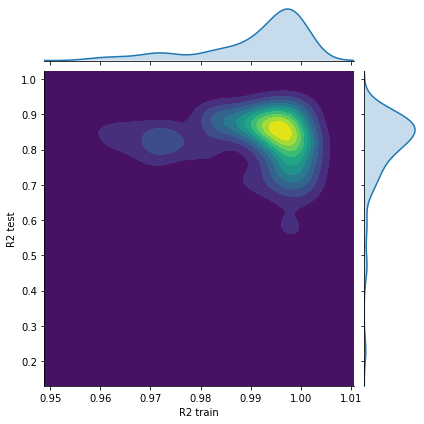

In [38]:
sns.jointplot('R2 train', 'R2 test', data = r4[0], kind = 'kde', cmap = 'viridis')
#plt.savefig('Dataset Images\R2 test-train-kde.png', dpi = 500)

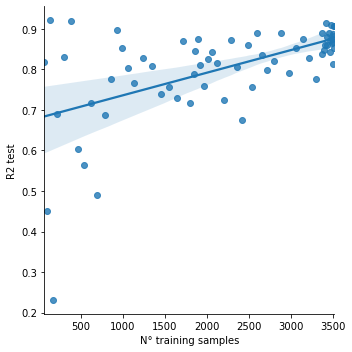

In [39]:
sns.lmplot('N° training samples', 'R2 test', data = r4[0])
#plt.savefig('Dataset Images\R2 test vs training samples.png', dpi = 500)

Given the influence shown of the number of training data on the performance of the model in unobserved data, it is possible to assume that obtaining new or more observations could result in an increase in performance. However, considering that the only way that the author of this project has to increase the volume of data is by imputing missing data under some criteria, and given the complex nature of the data used (panel data - time series for each variable per company) it is estimated that the use of any imputation technique could result in the addition of unnecessary noise instead of rich and meaningful information to explain firm leverage.


To get more interpretable results in line with the primary objectives of this project, and because the performance of 4th model formulation (Non-autoregressive model, with only financial indicators of growth, tangibility, liquidity, profitability and firm size lagged up to one year as explanatory variables) is good enough in terms of model performance  (0.75 of the models get test R2 score of more than 0.77), this formulation will be used to determine different variables effects on firm leverage.

In [40]:
# aux_pct = results_financial_lev.loc[results_financial_lev['R2 test']>0.5,'R2 train'].count()/results_financial_lev.shape[0]
# print('{:.2f}% of the models achieve an R2 test score over 0.5.'.format(aux_pct*100))
# print('Because of this its better to use total leverage models to analyze the impact of different variables.')

In [41]:
def manual_tune(period, xgb_params):

    remove_cols =['Industry Title',
                  'Growth', 'Total Equity',
                            'Tangibility',
                            'Liquidity',
                            'Profitability',
                            'Firm size',
                            'Total leverage',
                            'Financial leverage',
                            'Total Assets',
                            'Total Liabilities',
                            'Total Current Liabilities',
                            'Total Debt',
                            'Property/Plant/Equipment, Total - Net',
                            'Net Income',
                            'Total Current Assets']




    training_periods = 7

    X_train = data['complete'][4].loc[(slice(None),slice(period, period+training_periods)),:].drop(remove_cols, axis = 1)
    y_train = data['complete'][4].loc[(slice(None),slice(period, period+training_periods)),'Total leverage']

    X_cv, X_test, y_cv, y_test = train_test_split(data['complete'][4].loc[(slice(None),period+training_periods+1),:].drop(remove_cols, axis = 1), 
                                                  data['complete'][4].loc[(slice(None),period+training_periods+1),'Total leverage'], test_size=0.5, random_state=42)

    xgb = XGBRegressor(**xgb_params)
    xgb.fit(X_train,y_train)

    preds_train = xgb.predict(X_train)
    preds_cv = xgb.predict(X_cv)
    preds_test = xgb.predict(X_test)

    r2_train = r2_score(y_train,preds_train)
    r2_cv = r2_score(y_cv,preds_cv)

    print('best grid search cv score: {:.2f}'.format(opt_2y['{} - {}'.format(period, period+training_periods)].best_score))
    print('train score: {:.2f}, cv score: {:.2f}'.format(r2_train, r2_cv))    

    X_train, Z_train, clusters_train, y_train = transform(X_train, y_train)
    X_test, Z_test, clusters_test, y_test = transform(X_test,y_test)
    

Compute and save SHAP Values for sequential models.

In [42]:
def compute_shap_values(models_list, training_periods = 7, lagged_periods = 4, leverage = 'Total leverage', 
                                 use_non_financial_indicators = True, autoregressive = True):
    
    t0_cols =['Industry Title',
                  'Growth', 'Total Equity',
                            'Tangibility',
                            'Liquidity',
                            'Profitability',
                            'Firm size',
                            'Total leverage',
                            'Financial leverage',
                            'Total Assets',
                            'Total Liabilities',
                            'Total Current Liabilities',
                            'Total Debt',
                            'Property/Plant/Equipment, Total - Net',
                            'Net Income',
                            'Total Current Assets',] #These corresponds to all info in t0.
    

    
    
    if leverage == 'Total leverage':
        other_lev_col = ['Financial leverage']
    else: other_lev_col = ['Total leverage']
        
    if autoregressive == False:
        current_lev_col = [leverage]
    else: current_lev_col = []
        
        
    if use_non_financial_indicators == False:
        nfi_cols = pre_processed_info
    else: nfi_cols = []
    
    lagged_cols = [] 

    for col in  nfi_cols+other_lev_col+current_lev_col:
        for lag in range(1,lagged_periods+1):
            lagged_cols.append('{} - lag{}'.format(col,lag))
            
    remove_cols = t0_cols+lagged_cols
    
    end_period = pd.Period('2018Q4', freq = 'Q')-training_periods-1
    shap_values_train = []
    for period, i in zip(pd.period_range('2000Q1', end = end_period, freq = 'Q'), range(68)):
        X = data['complete'][lagged_periods].loc[(slice(None),slice(period, period+training_periods)),:].drop(remove_cols, axis = 1)
        print('Computing SHAP Values for model adjusted in period {} - {}'.
             format(period,period+training_periods))
        explainer = shap.TreeExplainer(models_list[i].fe_model, X)
        shap_values_train.append(explainer(X))
        
    if use_non_financial_indicators==True: a = 'use'
    else: a = 'dis'
        
    if autoregressive ==True: b = '_AR'
    else: b = ''

    pickle.dump(shap_values_train, open('shap_values_train-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                                       training_periods,
                                                                                       lagged_periods,a,b), 'wb'))

    shap_values_test = []
    for period, i in zip(pd.period_range('2000Q1', end = end_period, freq = 'Q'), range(68)):
        X = data['complete'][lagged_periods].loc[(slice(None), period+training_periods+1),:].drop(remove_cols, axis = 1)
        print('Computing SHAP Values for model adjusted in period {} - {}'.
             format(period,period+training_periods))
        explainer = shap.TreeExplainer(models_list[i].fe_model, X)
        shap_values_test.append(explainer(X))
        


    pickle.dump(shap_values_test, open('shap_values_test-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                                     training_periods,
                                                                                    lagged_periods,a,b), 'wb'))

In [43]:
# compute_shap_values(r1[1],**args_1)
# compute_shap_values(r2[1],**args_2)
# compute_shap_values(r3[1],**args_3)
# compute_shap_values(r4[1],**args_4)

Load SHAP Values for sequential models.

In [44]:
def load_shap_values_test(training_periods = 7, lagged_periods = 4, leverage = 'Total leverage',
                 use_non_financial_indicators = True, autoregressive = True):

    if use_non_financial_indicators==True: a = 'use'
    else: a = 'dis'
        
    if autoregressive ==True: b = '_AR'
    else: b = ''

    return pickle.load(open('shap_values_test-{}_{}tp_lag{}_{}NFI{}.pkl'.format(leverage,
                                                                                     training_periods,
                                                                                    lagged_periods,a,b), 'rb'))

In [45]:
#Load SHAP values test
# s1 = load_shap_values_test(**args_1)
# s2 = load_shap_values_test(**args_2)
# s3 = load_shap_values_test(**args_3)
s4 = load_shap_values_test(**args_4)

In [46]:
def plot_shap_time(var, shap_values,plot_scatter = True, plot_surface = True, plot_crisis = False,
                   filter_values = 0, max_scatter_points = None, outlier_filter = 0.1, 
                   angles = None, cmap_scatter = 'viridis', bins_surf = 50, keep_pct_surf = 0.9,animate = False, 
                   ax = None,frame = None, alpha_scatter = 0.2, alpha_surface = 0.5, alpha_crisis = 0.2,
                  training_periods = 7, lagged_periods = 4, leverage = 'Total leverage', 
                                 use_non_financial_indicators = True, autoregressive = True):
    '''
    var: variable for which to plot its SHAP values.

    filter_values: min R2 test score to plot corresponding points.All values with testing score less than stated 
    will not be considered for the scatter plot and the surface computing in each respective case.
    
    max_scatter_points: to plot in scatter plot. If None, all points will be plotted.
    
    angles: corresponds to the view_init() method to handle the degrees at which the plot is rendered.
    
    oulier filter: is the percentage of the distribution that will be left out while setting the limits for the x and z axis. I.e. the ranges for the specified 
    variable and the SHAP value for that variable. Useful for plotting the scatter points.
    
    angles: tuple('elev', 'azim').'elev' stores the elevation angle in the z plane (in degrees).
    'azim' stores the azimuth angle in the (x, y) plane (in degrees).
    
    Bins: corresponds to the number of bins to partition the variable 'Var' per year to plot the adjusted surface.
    
    keep_pct_surf: percentage of obsertvations to keep between surfaces per year.
    '''

    t0_cols =['Industry Title',
                  'Growth', 'Total Equity',
                            'Tangibility',
                            'Liquidity',
                            'Profitability',
                            'Firm size',
                            'Total leverage',
                            'Financial leverage',
                            'Total Assets',
                            'Total Liabilities',
                            'Total Current Liabilities',
                            'Total Debt',
                            'Property/Plant/Equipment, Total - Net',
                            'Net Income',
                            'Total Current Assets',] #These corresponds to all info in t0.
    

    
    
    if leverage == 'Total leverage':
        other_lev_col = ['Financial leverage']
    else: other_lev_col = ['Total leverage']
        
    if autoregressive == False:
        current_lev_col = [leverage]
    else: current_lev_col = []
        
        
    if use_non_financial_indicators == False:
        nfi_cols = pre_processed_info
    else: nfi_cols = []
    
    lagged_cols = [] 

    for col in  nfi_cols+other_lev_col+current_lev_col:#+ data_leak: 
        for lag in range(1,lagged_periods+1):
            lagged_cols.append('{} - lag{}'.format(col,lag))
            
    remove_cols = t0_cols+lagged_cols


    x_arr = np.array([])
    x_arr_q1 = np.array([])
    x_arr_q2 = np.array([])
    x_arr_q3 = np.array([])
    
    y_arr = np.array([])

    
#     y_arr_d = []
    z_arr = np.array([])
    z_arr_q1 = np.array([])
    z_arr_q2 = np.array([])
    z_arr_q3 = np.array([])
    
    c_arr = np.array([])
        
    var_index = list(data['complete'][4].drop(remove_cols, axis = 1).columns).index(var)
    for i in range(68):#len(merf_models)
        curr_size = shap_values[i].data.shape[0]
        x_arr = np.append(x_arr, shap_values[i].data[:,var_index])
        x_arr_q1 = np.append(x_arr_q1,np.quantile(shap_values[i].data[:,var_index], 0.25))
        x_arr_q2 = np.append(x_arr_q2,np.quantile(shap_values[i].data[:,var_index], 0.50))
        x_arr_q3 = np.append(x_arr_q3,np.quantile(shap_values[i].data[:,var_index], 0.75))
        y_arr = np.append(y_arr, np.full(curr_size,i))
#         for j in range(curr_size):
#             y_arr_d.append(periods[i])
                         
        z_arr = np.append(z_arr, shap_values[i].values[:,var_index])
        z_arr_q1 = np.append(z_arr_q1,np.quantile(shap_values[i].values[:,var_index], 0.25))
        z_arr_q2 = np.append(z_arr_q2,np.quantile(shap_values[i].values[:,var_index], 0.50))
        z_arr_q3 = np.append(z_arr_q3,np.quantile(shap_values[i].values[:,var_index], 0.75))
        
        c_arr = np.append(c_arr, np.full(curr_size, r4[0].loc[i,'R2 test']))
        
        
        
    #conserve 90% of x range to create rhe bins. 3280 dont have an assigned bin. This is done because if all
    #values are kept, we end with many bins with too few observations.
    a = 0.5+keep_pct_surf/2
    b = 0.5-keep_pct_surf/2
    def quantile_a(x):
        return np.quantile(x,a)
    def quantile_b(x):
        return np.quantile(x,b)


    shap_df = pd.DataFrame({'x':x_arr[c_arr>filter_values],'y':y_arr[c_arr>filter_values],'z':z_arr[c_arr>filter_values]})
    dec_1 = np.quantile(shap_df.x, 0.05)#It uses 90% of the central distribution of x_arr to compute the bins.
    dec_9 = np.quantile(shap_df.x, 0.95)
    bins = pd.cut(shap_df[(shap_df.x>dec_1)&(shap_df.x<dec_9)].x,bins = bins_surf)
    bins.name = 'bins'
    aux = pd.merge(shap_df,bins, left_index=True, right_index=True, how = 'left')
    aux = aux.groupby(['y','bins']).agg([quantile_a,quantile_b]).reset_index()
    aux.drop('x', level = 0, axis = 1, inplace = True)
    aux.columns = ['y', 'bins', 'z_quantile_a','z_quantile_b']
    aux['x_mid_bin'] = aux['bins'].apply(lambda x: x.mid)
    aux.drop('bins', axis = 1, inplace = True)


    vmin = aux['z_quantile_b'].min()
    vmax = aux['z_quantile_a'].max()

   

    
    #To remove outliers for setting axis limits.
    alpha = outlier_filter
    x_adj_range = np.quantile(x_arr, [alpha/2,1-alpha/2])
    z_adj_range = np.quantile(z_arr, [alpha/2,1-alpha/2])
    
    
    rand_index = np.random.choice(np.arange(c_arr[c_arr>filter_values].shape[0]), size = max_scatter_points, replace = False)


    
    
    if animate == False:
        fig = plt.figure(figsize = (12,6))
        ax = plt.axes(projection='3d')

    if plot_scatter == True:
        if max_scatter_points == None:
             sc = ax.scatter(x_arr[c_arr>filter_values],y_arr[c_arr>filter_values],z_arr[c_arr>filter_values], c  = c_arr[c_arr>filter_values], 
                             cmap = cmap_scatter, vmin = 0, vmax = 1, alpha = alpha_scatter)

        else: sc = ax.scatter(x_arr[c_arr>filter_values][rand_index],y_arr[c_arr>filter_values][rand_index],
                              z_arr[c_arr>filter_values][rand_index], c = c_arr[c_arr>filter_values][rand_index], 
                         cmap = cmap_scatter, vmin = 0,vmax = 1, alpha = alpha_scatter)
            
        if ((animate == True) & (frame == 0)) | (animate == False):
            plt.colorbar(sc, label = 'Validity of displayed effect (R2 test)')
    
    if plot_surface == True:
        ax.plot_trisurf(aux['x_mid_bin'], aux['y'], aux['z_quantile_a'], alpha = alpha_surface, 
                        cmap = 'cool', vmin = vmin, vmax = vmax)
        ax.plot_trisurf(aux['x_mid_bin'], aux['y'], aux['z_quantile_b'], alpha = alpha_surface, 
                        cmap = 'cool', vmin = vmin, vmax = vmax)
        
    
    if plot_crisis == True:
        xx = np.linspace(aux['x_mid_bin'].min(),aux['x_mid_bin'].max(),5)
        zz = np.linspace(aux['z_quantile_b'].min(),aux['z_quantile_a'].max(),5)

        X, Z = np.meshgrid(xx,zz)
        Y1 = np.full((X.shape[0], X.shape[1]), 24)#24 and 30 are the corresponding y_arr values to the start & end
        Y2 = np.full((X.shape[0], X.shape[1]), 30)#of the financial crisis in thr US.
        ax.plot_surface(X, Y1,Z, color = 'r', alpha = alpha_crisis)
        ax.plot_surface(X, Y2,Z, color = 'r', alpha = alpha_crisis)



    if alpha!=0:
        ax.set_xlim(x_adj_range[0],x_adj_range[1])
        ax.set_zlim(z_adj_range[0],z_adj_range[1])
    plt.xlabel(var)

    ax.set_zlabel('SHAP Value for {}'.format(var))
    if angles == None:
        ax.view_init(35, 35)
    else: ax.view_init(angles[0],angles[1])
    plt.yticks(ticks = np.arange(-1,68,8), labels = np.arange(2001,2020,2))
    

    

In [47]:
def compute_shap_values_agg(shap_values, training_periods = 7, lagged_periods = 4, leverage = 'Total leverage', 
                                 use_non_financial_indicators = True, autoregressive = True):
    '''Computes and returns a DataFrame with the SHAP Values of all the models and returns the 5
    most important varianbles. I.e variables with higher mean absolut SHAP Value.'''
    

    t0_cols =['Industry Title',
                  'Growth', 'Total Equity',
                            'Tangibility',
                            'Liquidity',
                            'Profitability',
                            'Firm size',
                            'Total leverage',
                            'Financial leverage',
                            'Total Assets',
                            'Total Liabilities',
                            'Total Current Liabilities',
                            'Total Debt',
                            'Property/Plant/Equipment, Total - Net',
                            'Net Income',
                            'Total Current Assets',] #These corresponds to all info in t0.
    

    pre_processed_info = ['Total Assets',
                      'Total Liabilities',
                      'Total Current Liabilities',
                      'Total Equity',
                      'Total Debt',
                      'Property/Plant/Equipment, Total - Net',
                      'Net Income',
                      'Total Current Assets',]
    
    if leverage == 'Total leverage':
        other_lev_col = ['Financial leverage']
    else: other_lev_col = ['Total leverage']
        
    if autoregressive == False:
        current_lev_col = [leverage]
    else: current_lev_col = []
        
        
    if use_non_financial_indicators == False:
        nfi_cols = pre_processed_info
    else: nfi_cols = []
        

    lagged_cols = [] 

    for col in  nfi_cols+other_lev_col+current_lev_col:#+ data_leak: 
        for lag in range(1,lagged_periods+1):
            lagged_cols.append('{} - lag{}'.format(col,lag))
            
    remove_cols = t0_cols+lagged_cols
    

    X = data['complete'][lagged_periods].drop(remove_cols, axis = 1)
    
    for i in range(len(shap_values)):
        if i == 0: shap_values_agg = shap_values[i].values
        else: shap_values_agg = np.vstack((shap_values_agg, shap_values[i].values))
    shap_values_agg_df = pd.DataFrame(shap_values_agg, columns=X.columns)
    return shap_values_agg_df, shap_values_agg_df.apply(np.abs).mean().sort_values(ascending = False).iloc[:5].index

In [48]:
s4_agg, top_vars_s4 = compute_shap_values_agg(s4, **args_4)
print(top_vars_s4)

Index(['Liquidity - lag1', 'Liquidity - lag4', 'Firm size - lag1',
       'Country of Headquarters_Brazil', 'Firm size - lag4'],
      dtype='object')


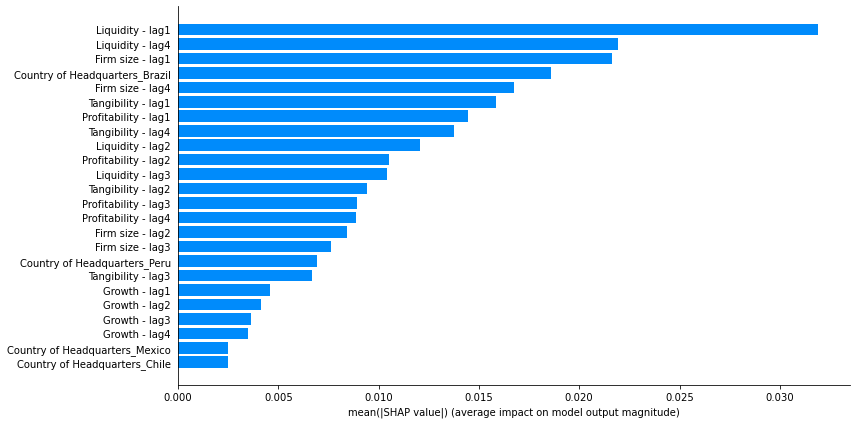

In [49]:
plt.figure(figsize=(12,6))
s4_agg.abs().mean().sort_values()
plt.barh(s4_agg.abs().mean().sort_values().index, s4_agg.abs().mean().sort_values(), color = '#008bfb')
plt.tick_params(left = False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.xlabel('mean(|SHAP value|) (average impact on model output magnitude)');
plt.tight_layout()
#plt.savefig('SHAP Plots\Bar summary-sequential-all',dpi = 500)

Showing just lag 1 variables to facilitate analysis.

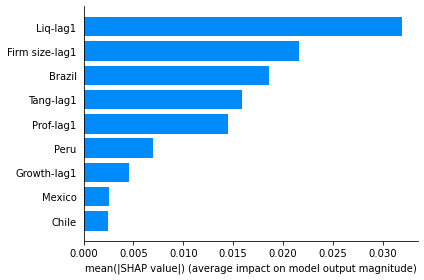

In [50]:
ind = ['Country of Headquarters_Brazil', 'Country of Headquarters_Chile',
      'Country of Headquarters_Mexico', 'Country of Headquarters_Peru',
      'Liquidity - lag1',
      'Firm size - lag1',
      'Growth - lag1',
      'Profitability - lag1',
      'Tangibility - lag1']

features_map = {'Liquidity - lag1': 'Liq-lag1',
                'Firm size - lag1': 'Firm size-lag1',
                'Country of Headquarters_Brazil':'Brazil',
                'Country of Headquarters_Chile':'Chile',
                'Country of Headquarters_Mexico':'Mexico',
                'Country of Headquarters_Peru':'Peru',
                'Growth - lag1':'Growth-lag1',
                'Tangibility - lag1':'Tang-lag1',
                'Profitability - lag1':'Prof-lag1'}





plt.barh( [features_map[a] for a in s4_agg.abs().mean()[ind].sort_values().index], s4_agg.abs().mean()[ind].sort_values(), color = '#008bfb')
plt.tick_params(left = False)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.xlabel('mean(|SHAP value|) (average impact on model output magnitude)');
plt.tight_layout()
#plt.savefig('SHAP Plots\Bar summary-sequential-lag1',dpi = 500)

In [51]:
# Creating update function needed to create gifs that show the impact of the explanatory 
# variables on total firm leverage.

n_frames_step = np.array([9,4,4,10,10,24,4,10,10])*10
n_step_end = np.array([])

for i in range(n_frames_step.shape[0]):
    n_step_end = np.append(n_step_end, n_frames_step[:i+1].sum())
print('Frame stop value for each step: {}'.format(n_step_end))
n = n_frames_step.sum()
print('n (stop): {}'.format(n))


def update(frame, var,shap_values, args):
    
    
    # check if animation is at the last frame, and if so, stop the animation a
    if frame >= n:
        a.event_source.stop()
        return
    
    plt.cla()
    
    
    
    
    ################   step 0 : show scatter points.  ###########################
    if frame <= n_step_end[0]:
        step = 0
        print('plotting step {}, frame {}, frame_adj = {}'.format(step,frame,frame))
        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = True, plot_surface = False,
                           frame = frame, **args)
        
    ################   step 1 : fade-in adjusted surface to scatter points.  ###########################
    elif (frame>n_step_end[0]) & (frame<= n_step_end[1]):
        step = 1
        frame_adj = frame - n_step_end[step-1]
        print('plotting step {}, frame {}, frame_adj = {}, surface_alpha {:.2f}'.format(step,frame,frame_adj,
                                                                                   0+0.5/n_frames_step[step]*frame_adj))
        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = True, plot_surface = True,
                           frame = frame, alpha_surface = 0+0.5/n_frames_step[step]*frame_adj,
                      **args)
        
        
    ################   step 2 : fade-out  scatter points & remove colorbar  ###########################
    
    elif (frame>n_step_end[1]) & (frame<= n_step_end[2]):
        step = 2
        frame_adj = frame - n_step_end[step-1]
        if frame == n_step_end[2]:
            plt.gcf().get_children()[2].remove()   #removes colorbar  on the last frame of this step.
        print('plotting step {}, frame {}, frame_adj {}, alpha_scatter {:.2f}'.format(step,frame, frame_adj,
                                                                                      0.2 - 0.2/n_frames_step[step]*frame_adj))

        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = True, plot_surface = True,
                           frame = frame,  alpha_surface = 0.5, alpha_scatter = 0.2 - 0.2/n_frames_step[step]*frame_adj,
                      **args)
                      #outlier_filter = 0.1-0.1/n_frames_step[1]*frame_adj)
            
        ################   step 3: show unscaled surface .  ###########################
    
    elif (frame>n_step_end[2]) & (frame<= n_step_end[3]):
        step = 3
        frame_adj = frame - n_step_end[step-1]
        print('plotting step {}, frame {}, frame_adj {}'.format(step, frame, frame_adj))

        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = False, plot_surface = True,
                           frame = frame,  alpha_surface = 0.5, **args)
        
     ################   step 4: show scaled surface .  ###########################
    
    elif (frame>n_step_end[3]) & (frame<= n_step_end[4]):
        step = 4
        frame_adj = frame - n_step_end[step-1]
        print('plotting step {}, frame {}, frame_adj {}'.format(step, frame, frame_adj))

        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = False, plot_surface = True,
                           frame = frame,  alpha_surface = 0.5, outlier_filter=0, **args)

        

        
        ################   step 5 : rotate plot. in z- axis  ###########################
    
    elif (frame>n_step_end[4]) & (frame<= n_step_end[5]):
        step = 5
        frame_adj = frame - n_step_end[step-1]
        print('plotting step {}, frame {}, frame_adj {}, angles: {:.2f},{:.2f}'.format(step, frame, frame_adj,
                                                                                     35-35/n_frames_step[step]*frame_adj,
                                                                                       35+(360-35)/n_frames_step[step]*frame_adj))

        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = False, plot_surface = True,
                           frame = frame, angles =(35-35/n_frames_step[step]*frame_adj,35+(360-35)/n_frames_step[step]*frame_adj), alpha_surface = 0.5, 
                       outlier_filter = 0, **args)
      
        

         ###############   step 6 : add crisis surface.  ###########################
    
    elif (frame>n_step_end[5]) & (frame<= n_step_end[6]):
        step = 6
        frame_adj = frame - n_step_end[step-1]
        print('plotting step {}, frame {}, frame_adj {}, angles {:.2f},{:.2f}'.format(step, frame, frame_adj,0,0))
        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = False, plot_surface = True,
                           frame = frame, angles =(0,0), alpha_surface = 0.5, 
                       alpha_crisis = 0.5/n_frames_step[step]*frame_adj, outlier_filter = 0, plot_crisis = True,**args)
        
        
        ################   step 7 : tilt to show 3d crisis period  ###########################
    
    elif (frame>n_step_end[6]) & (frame<= n_step_end[7]):
        step = 7
        frame_adj = frame - n_step_end[step-1]
        print('plotting step {}, frame {}, frame_adj {}, angles {:.2f},{:.2f}'.format(step,frame, frame_adj,
                                                                                    35/n_frames_step[step]*frame_adj,15/n_frames_step[step]*frame_adj))
        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = False, plot_surface = True,
                           frame = frame, angles =(35/n_frames_step[step]*frame_adj,15/n_frames_step[step]*frame_adj), 
                       alpha_surface = 0.5, alpha_crisis = 0.5, outlier_filter = 0, plot_crisis = True, **args)
       
        
        ################   step 8 : tilt back to mild axis alignment   ###########################
    
    else: 
        step = 8
        frame_adj = frame - n_step_end[7]
        print('plotting step {}, frame {}, frame_adj {}, angles {:.2f},{:.2f}'.format(step,frame, frame_adj,
                                                                            35 ,15-(7.5)/n_frames_step[step]*frame_adj))
        plot_shap_time(var,shap_values, animate = True, ax = ax, plot_scatter = False, plot_surface = True,
                           frame = frame, angles =(35 ,15-(7.5)/n_frames_step[step]*frame_adj), 
                       alpha_surface = 0.5, alpha_crisis = 0.5, outlier_filter = 0, plot_crisis = True, **args)
       

    
def init():
    #do nothing
    pass  


Frame stop value for each step: [ 90. 130. 170. 270. 370. 610. 650. 750. 850.]
n (stop): 850


In [52]:
# i = 1
# # for var in s4_agg.abs().mean().sort_values(ascending = False).index[:19]:
# for var in ['Liquidity - lag1', 'Firm size - lag1']:
#     print('Plotting {}, var {}/{}'.format(var, i,s4_agg.shape[1]))
#     plt.close()
#     fig = plt.figure(figsize=(12,6))
#     ax = plt.axes(projection = '3d')
#     a = animation.FuncAnimation(fig, update, interval=0.06, fargs=(var, 
#                                                                    s4, args_4),init_func = init,
#                                frames = range(n))

#     writer = PillowWriter(fps=60)  
#     a.save('Variable effects - gifs\Formulation4 - Total leverage - {}.gif'.format(var), writer=writer)
#     i = i+1

In [53]:
# Save 3d plots in specific angles

# for var in s4_agg.columns[:-4]:#
#     for angles in [(0,0),(0,-90),(35,35)]:
#         plt.close()
    
#         if angles == (0,0): 
#             crisis = True
#             name = 'time'
#         elif angles == (0,-90): 
#             name = 'var'
#             crisis = False
#         else:
#             name = 'elev'
#             crisis = False
            

#         args = {'var': var, 
#             'shap_values':s4,
#             'alpha_surface':0.2,
#             'max_scatter_points':None, 
#             'angles' : angles,
#             'filter_values' : 0, 
#             'outlier_filter' :0, 
#             'keep_pct_surf':0.9,
#             'bins_surf' : 100, 
#             'plot_scatter': False,
#             'plot_surface' : True, 
#             'plot_crisis' : crisis,
#            'animate': False}
#         plot_shap_time(**args, **args_4);

#         plt.savefig('SHAP Plots\{} - {}.png'.format(var,name))

Cell for manual interactive plotting. It is recommended to make use of this cell to explore in a more detailed and in-depth way the effect of the different financial indicators, together with their level of lag on the total leverage of the firms.

In [54]:
# %matplotlib 

# args = {'var': 'Profitability - lag2', 
#         'shap_values':s4,
#         'alpha_surface':0.2,
#         'max_scatter_points':None, 
#         'angles' : (0,0),
#         'filter_values' : 0, 
#         'outlier_filter' :0, 
#         'keep_pct_surf':0.9,
#         'bins_surf' : 100, 
#         'plot_scatter': False,
#         'plot_surface' : True, 
#         'plot_crisis' : True,
#        'animate': False}
# plot_shap_time(**args, **args_4)

In [55]:
#Image('Variable effects - gifs\Formulation4 - Total leverage - Liquidity - lag3.gif')

From now on, a second approach for analizing the impact of different variables uppon total leverage is proposed: fitting static models to three macro time periods: pre-crisis, crisis and post-crisis.

Be aware that this approach, more than explaining firm leverage, can result in explaining internal variable correlation because of data leakage; information of total leverage in one period is cointained in other financial indicators because of the way these are constructed. The principal motivation for this proposal is to trade-off validity for interpretability.

In [56]:
def fit_static_models(leverage):

    best_params = []
    r2_train = []
    r2_test = []
    r2_cv = []
    period_train_start = []
    period_train_end = []
    period_test_start = []
    period_test_end = []
    n_samples_train = []
    n_samples_cv = []
    n_samples_test = []
    opt_2y = []
    merf_2y = []
    

    

    
    
    grid = {'n_estimators':[2,5,10,20,30,40,50,100,200,300,500,1000,1250,1500,1750,2000,2250,2500], 
             'max_depth':[3],
              'n_jobs':[-1],
              'learning_rate': np.logspace(0,-4,5)}
    
    period_start_end  = {'pre-crisis':(pd.Period('2000Q2', freq = 'Q'), pd.Period('2007Q4', freq = 'Q')),
                        'crisis': (pd.Period('2007Q4',freq = 'Q'),pd.Period('2009Q3',freq = 'Q')),
                        'post-crisis':(pd.Period('2009Q3', freq = 'Q'),pd.Period('2018Q4',freq = 'Q')),
                        'complete': (pd.Period('2000Q1', freq = 'Q'), pd.Period('2018Q4', freq = 'Q'))}
    
    

    
    testing_periods = 4  
    for period in ['pre-crisis','crisis', 'post-crisis', 'complete']:
            X = data[period][0].iloc[:,9:].drop(['Total leverage', 'Financial leverage'], axis = 1)
            y = data[period][0][leverage]
        
        
        
        
            X_train = X.loc[(slice(None),slice(period_start_end[period][0],period_start_end[period][1]-testing_periods)),:]
            y_train = y.loc[(slice(None),slice(period_start_end[period][0], period_start_end[period][1]-testing_periods))]
            
            X_rest = X.loc[(slice(None),slice(period_start_end[period][1]-testing_periods+1,period_start_end[period][1])),:]
            y_rest = y.loc[(slice(None),slice(period_start_end[period][1]-testing_periods+1,period_start_end[period][1]))]
            
            
            X_cv, X_test, y_cv, y_test = train_test_split(X_rest, y_rest, test_size=0.5, random_state=42)

            
            print('Optimizing model - period {}'.format(period))
            print('training period: {} - {}'.format(period_start_end[period][0], 
                                                             period_start_end[period][1]-testing_periods))
            print('cross-val period: {} - {}'.format(period_start_end[period][1]-testing_periods+1,
                                                    period_start_end[period][1]))
            
            opt = GridSearch(model = XGBRegressor(),param_grid = grid,parallelize = False)

            opt.fit(X_train, y_train, X_cv, y_cv)
            print('Validation R2 Score for Optimized Parameters: {:.2f}'.format(opt.best_score))
            print('Best params: {}'.format(opt.best_params))


            X_train, Z_train, clusters_train, y_train = transform(X_train, y_train)
            X_test, Z_test, clusters_test, y_test = transform(X_test,y_test)

            merf = MERF(fixed_effects_model = XGBRegressor(**opt.best_params), max_iterations = 20,
                       gll_early_stop_threshold = 0.001)

#             print('Training model with {} samples - period {}'.format(X_train.shape[0],  period+training_periods+1))
            merf.fit(X_train, Z_train, clusters_train, y_train)

            preds_train = merf.predict(X_train, Z_train,clusters_train)
            preds_test = merf.predict(X_test, Z_test, clusters_test)
#             print('Testing model with {} samples - period {}'.format(X_test.shape[0],  period+training_periods+1))
#             print('R2 train: {:.2f}\nR2 test: {:.2f}\n'.format(r2_score(y_train,preds_train), r2_score(y_test,preds_test)))


            r2_cv.append(opt.best_score)
            r2_train.append(r2_score(y_train,preds_train))
            r2_test.append(r2_score(y_test,preds_test))
            
            period_train_start.append(period_start_end[period][0])
            period_train_end.append(period_start_end[period][1]-testing_periods)
            period_test_start.append(period_start_end[period][1]-testing_periods+1)
            period_test_end.append(period_start_end[period][1])
            
            n_samples_train.append(X_train.shape[0])
            n_samples_cv.append(X_cv.shape[0])
            n_samples_test.append(X_test.shape[0])
            
            opt_2y.append(opt)
            merf_2y.append(merf)


            results_df = pd.DataFrame({'R2 train': r2_train,
                                       'R2 cv': r2_cv,
                                       'R2 test': r2_test,
                                       'Training period start': period_train_start,
                                       'Training period end': period_train_end,
                                       'Testing period start': period_test_start,
                                       'Testing period end': period_test_end,
                                       'N° training samples': n_samples_train,
                                       'N° testing samples': n_samples_test})




    #Saving dataframe
    results_df.to_csv('grid_search_results_second_app - {}.csv'.format(leverage))

    #Saving merf models
    pickle.dump(merf_2y, open('merf_models_second_app - {}.pkl'.format(leverage), 'wb'))

    #Saving grid search objects 
    pickle.dump(opt_2y, open('grid_search_objects_second_app - {}.pkl'.format(leverage), 'wb')) 

In [57]:
# fit_static_models('Total leverage')
# fit_static_models('Financial leverage')

In [58]:
merf_models_second_app = pickle.load(open('merf_models_second_app - Total leverage.pkl', 'rb'))
#grid_search_objects_second_app = pickle.load(open('grid_search_objects_second_app.pkl', 'rb'))
aux1 = pd.read_csv('grid_search_results_second_app - Total leverage.csv', index_col = 0)
aux1

,R2 train,R2 cv,R2 test,Training period start,Training period end,Testing period start,Testing period end,N° training samples,N° testing samples
0,0.944110,0.493080,0.714769,2000Q2,2006Q4,2007Q1,2007Q4,4742,626
1,0.990528,0.546565,0.865298,2007Q4,2008Q3,2008Q4,2009Q3,1319,754
2,0.941062,0.542219,0.783091,2009Q3,2017Q4,2018Q1,2018Q4,15013,858
3,0.904159,0.530588,0.727629,2000Q1,2017Q4,2018Q1,2018Q4,23156,858


In [59]:
aux2 = pd.read_csv('grid_search_results_second_app - Financial leverage.csv', index_col = 0)
aux2

,R2 train,R2 cv,R2 test,Training period start,Training period end,Testing period start,Testing period end,N° training samples,N° testing samples
0,0.236351,-0.001744,0.173039,2000Q2,2006Q4,2007Q1,2007Q4,4742,626
1,0.943821,0.030405,0.256452,2007Q4,2008Q3,2008Q4,2009Q3,1319,754
2,0.074903,-0.023260,-20.650839,2009Q3,2017Q4,2018Q1,2018Q4,15013,858
3,0.257225,-0.009212,-3.546015,2000Q1,2017Q4,2018Q1,2018Q4,23156,858


In [60]:
aux3 = pd.read_csv('grid_search_results-Total leverage_7tp_lag4_disNFI.csv', index_col = 0)
aux4 = pd.read_csv('grid_search_results-Financial leverage_7tp_lag4_disNFI.csv', index_col = 0)

In [61]:
aux5 = pd.DataFrame({'Total leverage Static model': aux1.iloc[:-1,2],
              'Total leverage (mean) Sequential model': [aux3.iloc[:24]['R2 test'].mean(), 
                                                       aux3.iloc[24:31]['R2 test'].mean(),
                                                      aux3.iloc[31:]['R2 test'].mean()],
              'Financial leverage Static model': aux2.iloc[:-1,2],
             'Financial leverage (mean) Sequential model': [aux4.iloc[:24]['R2 test'].mean(), 
                                                       aux4.iloc[24:31]['R2 test'].mean(),
                                                      aux4.iloc[31:]['R2 test'].mean()]}, )
aux5.index = ['pre-crisis','crisis','post-crisis']
aux5.columns.name = 'R2 test'
aux5.round(2)

R2 test,Total leverage Static model,Total leverage (mean) Sequential model,Financial leverage Static model,Financial leverage (mean) Sequential model
pre-crisis,0.71,0.73,0.17,-3.44
crisis,0.87,0.82,0.26,-3.99
post-crisis,0.78,0.85,-20.65,-124.89


In [62]:
aux5.mean().round(2)

R2 test
Total leverage Static model                    0.79
Total leverage (mean) Sequential model         0.80
Financial leverage Static model               -6.74
Financial leverage (mean) Sequential model   -44.11
dtype: float64

In aggregate terms the static and sequential formulations have practically equal performance. However, because changes in the effects of different variables on total firm leverage might occur in short time spans (few samples with altered behavior), this could possibly have non-significant influence in the performance metric (r2 score). This phenomenon of short time span changes in effect of variables could not possibly be detected by the static model formulations and would not be reflected in the aggregate performance of the model. Because of this, is encouraged to use both model formulations with these considerations in mind to get accurate inferences about the impact and change of different firm characteristics on total leverage.

Even more, because the formulation that includes the raw financial information archives even better performance than the temporal (sequanetial) models that only include only financial indicators to explain total leverage, it's possible to assume that there are more characteristics of firms, that aren't contained within the used financial indicators that determine total leverage.

Compute and save SHAP Values for second approximation.

In [63]:
# i=0
# shap_values = []
# shap_interaction_values = []
# testing_periods = 4  

# period_start_end  = {'pre-crisis':(pd.Period('2000Q2', freq = 'Q'), pd.Period('2007Q4', freq = 'Q')),
#                     'crisis': (pd.Period('2007Q4',freq = 'Q'),pd.Period('2009Q3',freq = 'Q')),
#                     'post-crisis':(pd.Period('2009Q3', freq = 'Q'),pd.Period('2018Q4',freq = 'Q')),
#                     'complete': (pd.Period('2000Q1', freq = 'Q'), pd.Period('2018Q4', freq = 'Q'))}

# for period in ['pre-crisis','crisis', 'post-crisis']:
#         X = data[period][0].iloc[:,9:].drop(['Total leverage', 'Financial leverage'], axis = 1)
#         y = data[period][0]['Total leverage']

#         X_train = X.loc[(slice(None),slice(period_start_end[period][0],period_start_end[period][1]-testing_periods)),:]
#         y_train = y.loc[(slice(None),slice(period_start_end[period][0], period_start_end[period][1]-testing_periods))]

#         explainer = shap.TreeExplainer(merf_models_second_app[i].fe_model,X_train)
        
#         shap_values.append(explainer(X_train))  
#         i = i+1
# pickle.dump(shap_values, open('shap_values_train_second_app.pkl', 'wb')) 

Load SHAP Values for second approximation.

In [64]:
shap_values = pickle.load(open('shap_values_train_second_app.pkl', 'rb'))

In [65]:
features = ['Growth',
       'Tangibility', 'Liquidity', 'Profitability', 'Firm size',
       'Country of Headquarters_Brazil', 'Country of Headquarters_Chile',
       'Country of Headquarters_Mexico', 'Country of Headquarters_Peru']


period_map = {0: 'pre-crisis',
             1:'crisis',
             2:'post-crisis'}

def pct_a(series):return np.quantile(series, 0.005)
def pct_b(series):return np.quantile(series, 0.995)

a = data['complete'][0][features[:-4]].apply(pct_a)
b = data['complete'][0][features[:-4]].apply(pct_b)

fig, ax = plt.subplots(3,3, figsize = (23,15), gridspec_kw=dict(wspace=0.4), dpi = 500)
for j in range(3):
    for i in range(3):
        shap.dependence_plot(j, shap_values[i].values,shap_values[i].data, 
                             feature_names=features, ax = ax[j,i], show = False,
                             xmin = a.iloc[j], xmax = b.iloc[j])
#plt.gcf().savefig('SHAP Plots\grid1.png',dpi = 1000)

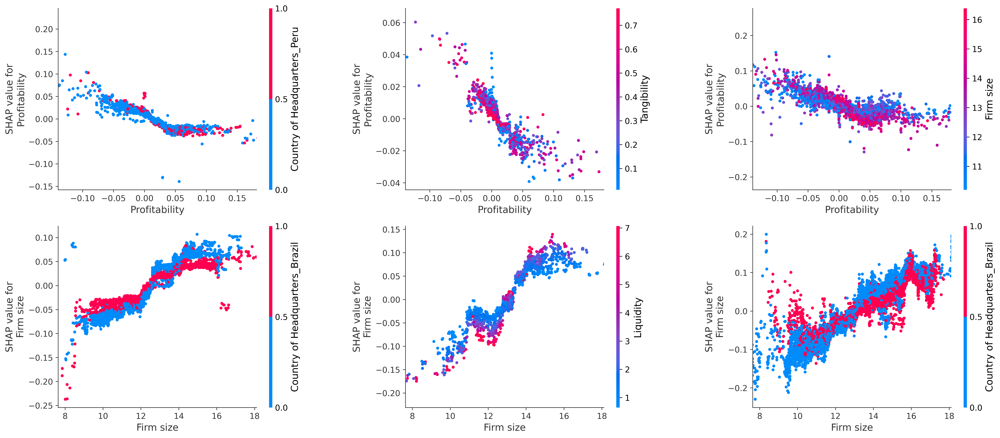

In [66]:
fig, ax = plt.subplots(2,3, figsize = (23,10), gridspec_kw=dict(wspace=0.4), dpi = 500)
for j in range(3,5):
    for i in range(3):
        shap.dependence_plot(j, shap_values[i].values,shap_values[i].data, 
                             feature_names=features, ax = ax[j-3,i], show = False,
                             xmin = a.iloc[j], xmax = b.iloc[j])
#plt.gcf().savefig('SHAP Plots\grid2.png',dpi = 1000)

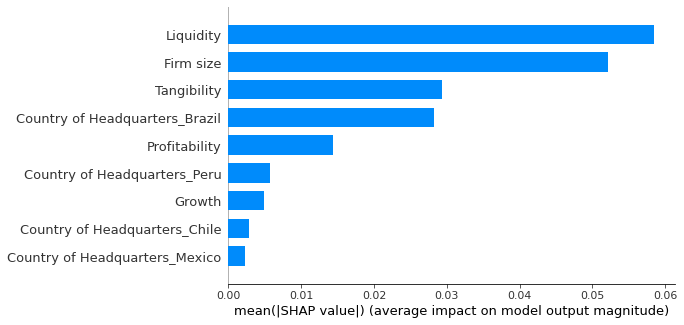

In [67]:
for i in range(3):
    plt.clf()
    shap.summary_plot(shap_values[i].values, shap_values[i].data,feature_names = features,plot_type='bar',
                      show = False)
    #plt.gcf().savefig('SHAP Plots\Bar summary plot - {}.png'.format(period_map[i]),dpi = 500)

The output of both formulations are almost the same, However the sequential formulation enables to examine more in-depth each firm characteristic effect in total leverage evolution through time.